### **Introduccion y analisis de la biblioteca MNE**

La biblioteca de MNE en Python es una herramienta de codigo abierto que permite, explorar, visuañizar y analizar datos neurofisiológicos humanos, incluyendo MEG, EEG, sEEG, ECoG, NIRS entre otros. Esta libreria es desarrollada por el centro Athinouola A. Martinos Center for Biomedical Imaging y ofrece funciones principalmente diseñadas para Python, Facilitando el procesamiento datos cientificos, aplicaiones de estadística, procesamiento de señales e imágenes, optimización de funciones, entre otros, a través de interfaces amigables con el usuario.

#### **Tipos de Datos Neurofisiológicos**
- MEG: Magnetoencefalografía, que registra la actividad cerebral a través de campos magnéticos.
- EEG: Electroencefalografía, que registra la actividad eléctrica del cerebro.
- sEEG: Electrocorticografía subdural, que mide la actividad eléctrica directamente desde la superficie del cerebro.
- ECoG: Electrocorticografía, que registra la actividad eléctrica del cerebro utilizando electrodos implantados en la corteza cerebral.
- NIRS: Espectroscopia cercana al infrarrojo, que monitorea la oxigenación cerebral midiendo cambios en la absorción de luz infrarroja.

In [38]:
#Descripcion general del análisis de MEG/EEG con MNE-Python
#Importación de modulos necesarios
import mne
import numpy as np

#Carga de datos (Datos de ejemplo proporcionados por MNE-Python)
sample_data_folder = mne.datasets.sample.data_path()
#Carga de datos MEG
sample_data_raw_file = (
    sample_data_folder / "MEG" / "sample" / "sample_audvis_filt-0-40_raw.fif"
)
#Mostramos la informacion sobre el archivo que acabamos de cargar
rawExample = mne.io.read_raw_fif(sample_data_raw_file)

Opening raw data file C:\Users\josaf\mne_data\MNE-sample-data\MEG\sample\sample_audvis_filt-0-40_raw.fif...
    Read a total of 4 projection items:
        PCA-v1 (1 x 102)  idle
        PCA-v2 (1 x 102)  idle
        PCA-v3 (1 x 102)  idle
        Average EEG reference (1 x 60)  idle
    Range : 6450 ... 48149 =     42.956 ...   320.665 secs
Ready.


In [39]:
#Informacion de la carga de datos
print("Informacion 'raw'\n")
print(rawExample)
#Informacion de los datos ubicaciones de los canales, filtros, pryeciones, etc.
print("Informacion 'raw.info'\n")
print(rawExample.info)

Informacion 'raw'

<Raw | sample_audvis_filt-0-40_raw.fif, 376 x 41700 (277.7 s), ~3.2 MB, data not loaded>
Informacion 'raw.info'

<Info | 14 non-empty values
 bads: 2 items (MEG 2443, EEG 053)
 ch_names: MEG 0113, MEG 0112, MEG 0111, MEG 0122, MEG 0123, MEG 0121, MEG ...
 chs: 204 Gradiometers, 102 Magnetometers, 9 Stimulus, 60 EEG, 1 EOG
 custom_ref_applied: False
 dev_head_t: MEG device -> head transform
 dig: 146 items (3 Cardinal, 4 HPI, 61 EEG, 78 Extra)
 highpass: 0.1 Hz
 hpi_meas: 1 item (list)
 hpi_results: 1 item (list)
 lowpass: 40.0 Hz
 meas_date: 2002-12-03 19:01:10 UTC
 meas_id: 4 items (dict)
 nchan: 376
 projs: PCA-v1: off, PCA-v2: off, PCA-v3: off, Average EEG reference: off
 sfreq: 150.2 Hz
>


In [40]:
# Obtener el montaje
montage = rawExample.info['chs']

# Imprimir las coordenadas de todos los electrodos
print("Coordenadas de todos los electrodos:")
for channel in montage:
    print(f"Electrodo: {channel['ch_name']}, Coordenadas: {channel['loc']}")


Coordenadas de todos los electrodos:
Electrodo: MEG 0113, Coordenadas: [-0.1066      0.0464     -0.0604     -0.0127      0.0057     -0.99990302
 -0.186801   -0.98240298 -0.0033     -0.98232698  0.18674099  0.013541  ]
Electrodo: MEG 0112, Coordenadas: [-0.1066      0.0464     -0.0604     -0.186801   -0.98240298 -0.0033
  0.0127     -0.0057      0.99990302 -0.98232698  0.18674099  0.013541  ]
Electrodo: MEG 0111, Coordenadas: [-0.1066      0.0464     -0.0604     -0.0127      0.0057     -0.99990302
 -0.186801   -0.98240298 -0.0033     -0.98232698  0.18674099  0.013541  ]
Electrodo: MEG 0122, Coordenadas: [-0.102       0.0631     -0.0256      0.0136      0.0011     -0.99990201
 -0.28200099 -0.95940202 -0.0049     -0.95931298  0.28203899 -0.012738  ]
Electrodo: MEG 0123, Coordenadas: [-0.102       0.0631     -0.0256     -0.28200099 -0.95940202 -0.0049
 -0.0136     -0.0011      0.99990201 -0.95931298  0.28203899 -0.012738  ]
Electrodo: MEG 0121, Coordenadas: [-0.102       0.0631     -0.0256

Effective window size : 13.639 (s)
Plotting power spectral density (dB=True).


c:\Users\josaf\AppData\Local\Programs\Python\Python312\Lib\site-packages\mne\viz\utils.py:167: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


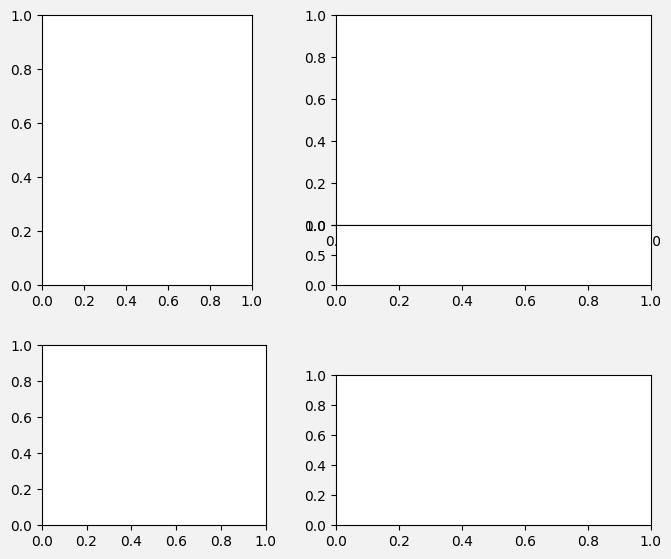

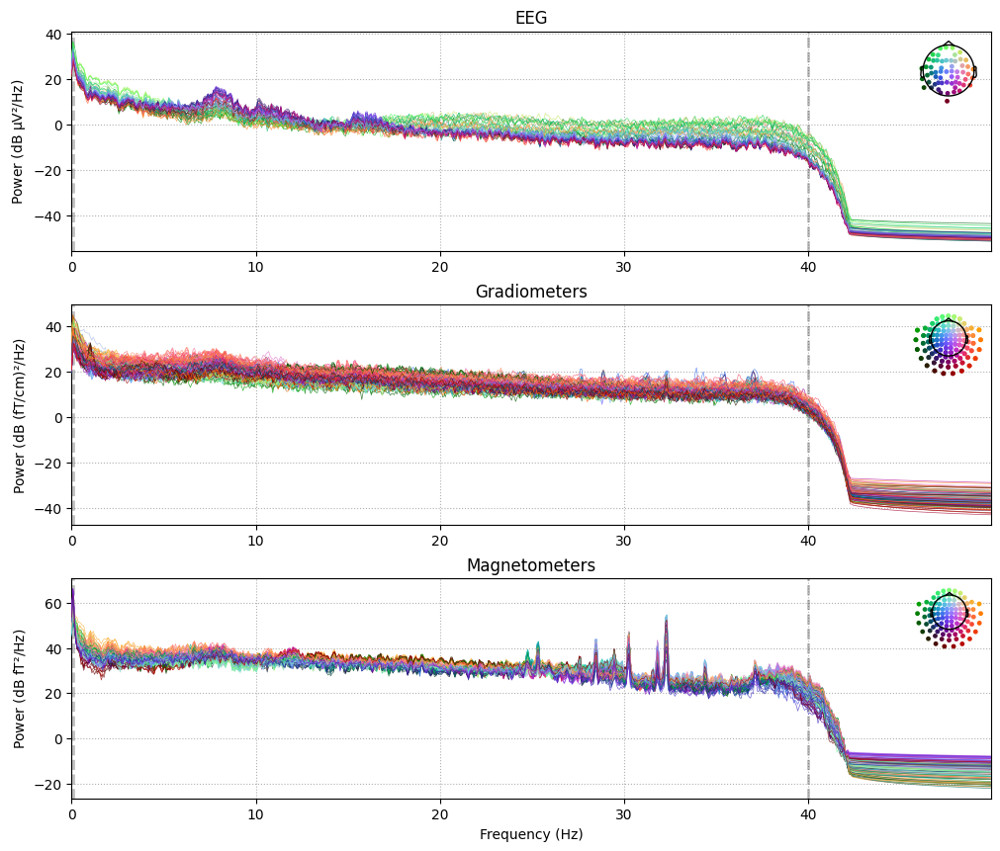

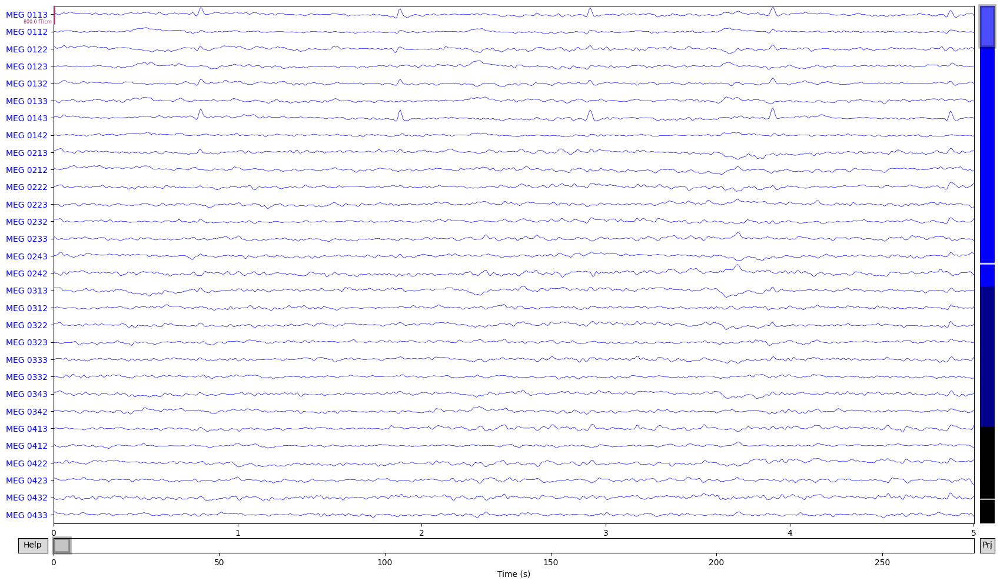

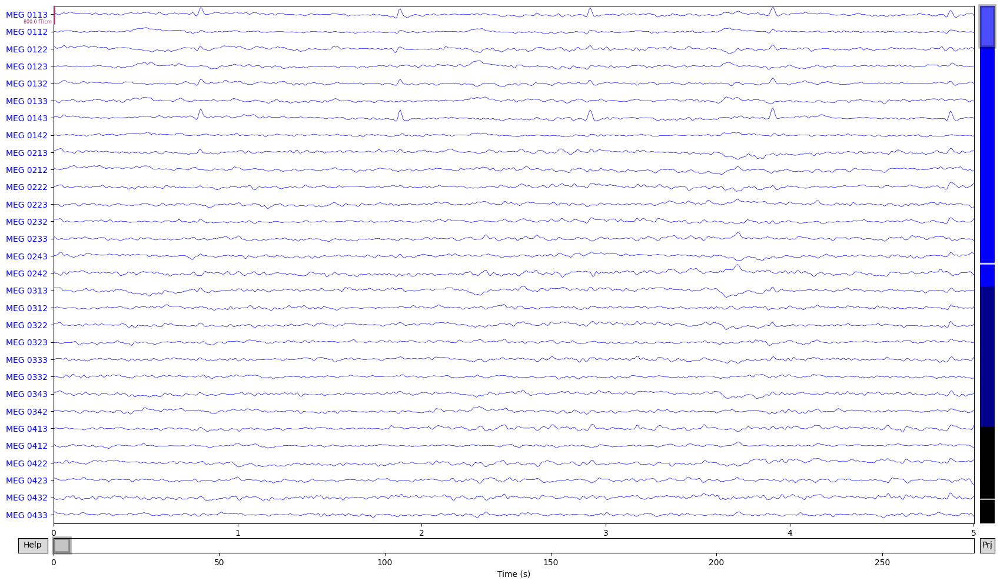

In [41]:
#Imprimimos la desnidad de potencia espectral (PSD) de los datos, "fmax" es la frecuencia máxima a la que se calcula el PSD
rawExample.compute_psd(fmax=50).plot(picks="data", exclude="bads", amplitude=False)
#Imprimimos el grafico de los datos en bruto, este es un grafico interactivo, escalar, marcado de canales defectuosos y anotaciones.
rawExample.plot(duration=5, n_channels=30)

### **Prepocesamiento**

MNE-Pyhton admie una variedad de enfoques y técnicas de preprocesamiento (Filtrado de Maxwell, Proyeccion del espacio de señales, Análisis de componentes independientes, Filtrado, Reduccion de muestreo, etc). Para el siguiente ejemplo se limpiaran los datos mediante la realización de análisis de componentes independientes (ICA)

- **Filtrado de Maxwell**
    - El filtrado de Maxwell es una técnica de preprocesamiento utilizada en el procesamiento de señales. Consiste en el uso de un filtro que elimina las componentes de alta frecuencia de una señal, lo que puede ser útil para reducir el ruido y mejorar la calidad de la señal.
- **Proyección del espacio de señales**
    - La proyección del espacio de señales es una técnica de preprocesamiento utilizada en el procesamiento de señales para reducir la dimensionalidad de un conjunto de señales. Esto se logra mediante la proyección de las señales en un espacio de menor dimensión, lo que puede ser útil para reducir el ruido y mejorar la eficiencia del procesamiento.
- **Análisis de componentes independientes (ICA):**
    - El análisis de componentes independientes (ICA) es una técnica de preprocesamiento utilizada en el procesamiento de señales para separar señales mezcladas. ICA es una técnica de aprendizaje no supervisado que busca encontrar una transformación lineal invertible que convierta una mezcla de señales en señales estadísticamente independientes.
- **Filtrado**
    - El filtrado es una técnica de preprocesamiento utilizada en el procesamiento de señales para eliminar las componentes de alta frecuencia de una señal. Existen diferentes tipos de filtros, como  filtros de paso bajo, paso alto, paso banda y rechazo de banda, que se utilizan para diferentes propósitos.
- **Reducción de muestreo**
    - La reducción de muestreo es una técnica de preprocesamiento utilizada en el procesamiento de señales para reducir la frecuencia de muestreo de una señal. Esto se puede hacer mediante la eliminación de muestras redundantes o mediante la interpolación de nuevas muestras. La reducción de muestreo puede ser útil para reducir el tamaño de los datos y mejorar la eficiencia del procesamiento.

Fitting ICA to data using 364 channels (please be patient, this may take a while)
Selecting by number: 20 components
Fitting ICA took 2.8s.
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
138 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
138 matching events found
No baseline correction applied
0 projection items activated


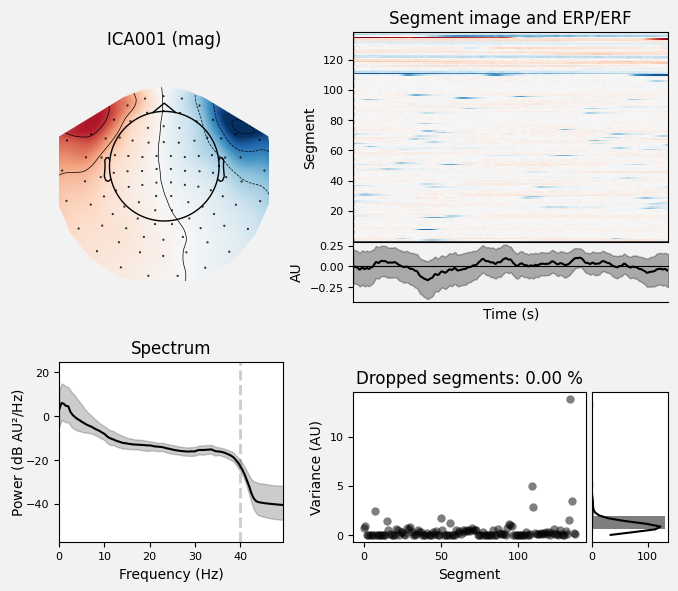

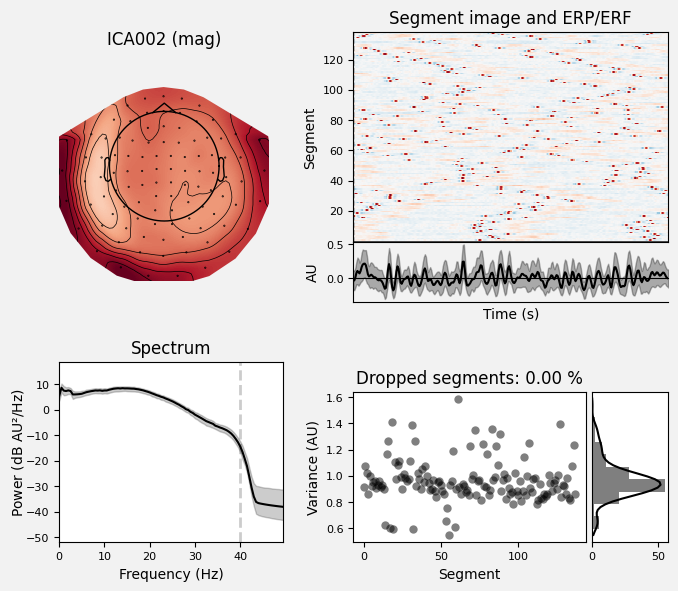

[<Figure size 700x600 with 6 Axes>, <Figure size 700x600 with 6 Axes>]

In [42]:
#Creamos una instancia de ICA con 20 componentes y un estado aleatorio
#"n_components" es el número de componentes independientes a estimar
#"random_state" es la semilla aleatoria para la inicialización
#"max_iter" es el número máximo de iteraciones para la convergencia
ica = mne.preprocessing.ICA(n_components=20, random_state=97, max_iter=800)
#Aplicamos el ICA
ica.fit(rawExample)
#Excluimos los componentes 1 y 2
ica.exclude = [1, 2]
#Ploteamos las propiedades de los componentes excluidos
ica.plot_properties(rawExample, picks=ica.exclude)

### **Análisis de componentes independientes (ICA)**
El análisis de componentes independientes (ICA) es una técnica de preprocesamiento utilizada en el procesamiento de señales EEG para separar señales de procesos cerebrales y no cerebrales independientes en el tiempo y la funcion. La ICA se basa en la suposicion de que las señales de procesos neuronales distintos se mezclan linealmente en las señalees grabadas y que componenentes distintos son estacionarios en el espcio. La técnica se utiliza para separar los datos del canal en componentes de señal con cursos temporales independientes, lo que puede ser útil en sí mismo. La ICA ha demostrado ser eficaz en la separación de señales de procesos cerebrales y no cerebrales independientes en el tiempo y la función, lo que aumenta la calidad del análisis de los datos EEG

Los coeficientes de la ICA se utilizan como proxy para identificar la contribución espacial al componente de la señal, y es posible crear mapas de calor para cada componenet. EN el caso de los datos EEG, la ICA puede identificar y eliminar los artefactos de movimiento, como los movimientos de los párpados, que pueden contaminar la señal neural. Sin embargo, es importante utilizar la ICA con precaución, ya que los métodos basados en datos no asumen ningún conocimiento previo sobre el sistema, y la confusión y las conclusiones erróneas son comunes. Pos lo tanto, es esencial verificar los requisitos y evaluar los resultados con atención. 

Reading 0 ... 41699  =      0.000 ...   277.709 secs...
Applying ICA to Raw instance
    Transforming to ICA space (20 components)
    Zeroing out 2 ICA components
    Projecting back using 364 PCA components


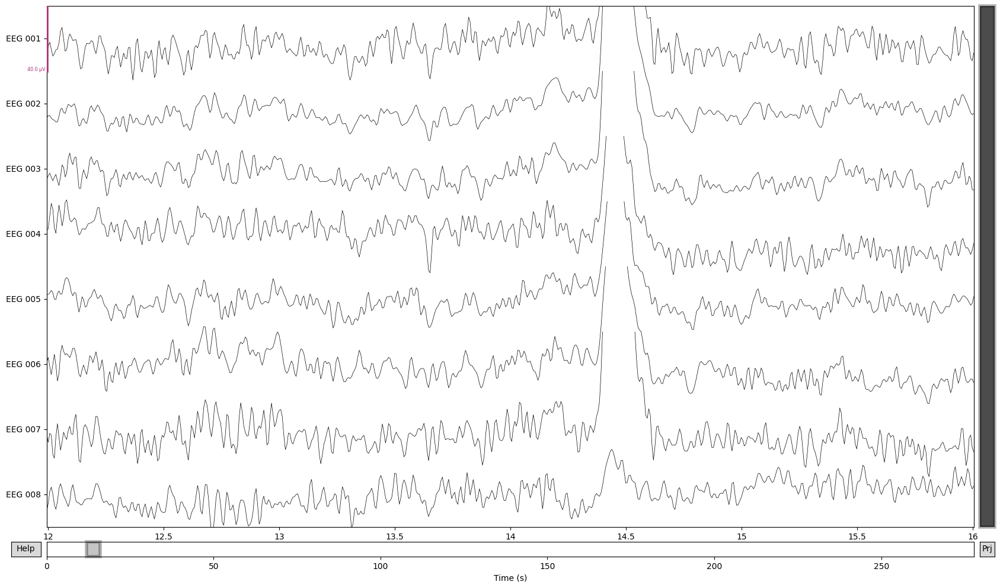

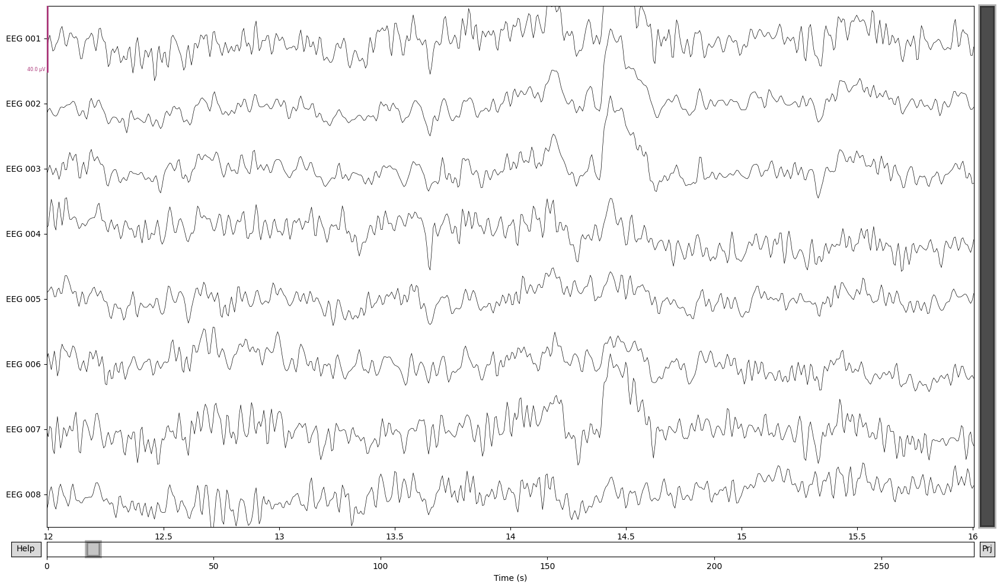

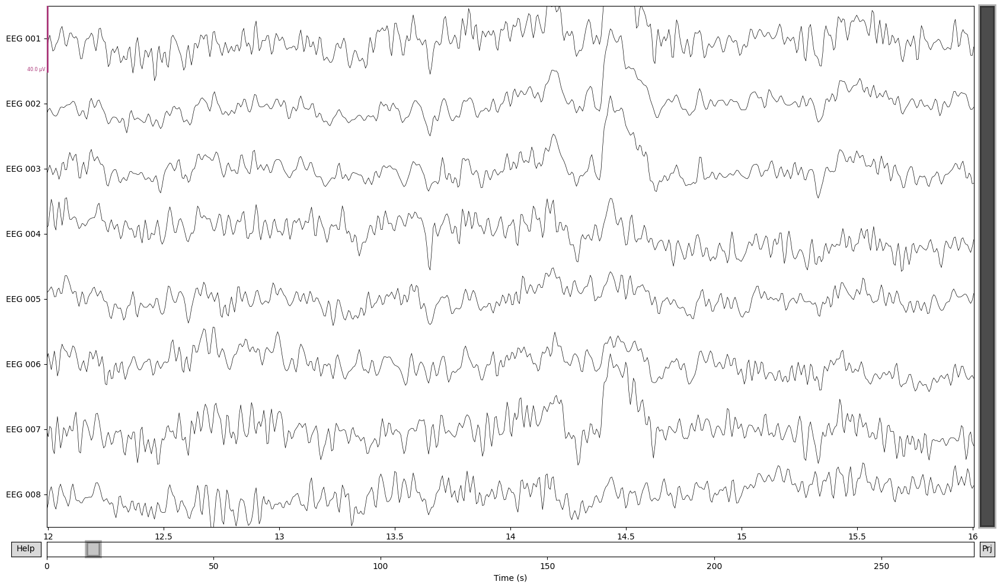

In [43]:
#Hacemos un copia de seguridad de los datos originales y aplicamos el ICA
orig_raw = rawExample.copy()
rawExample.load_data()
#Aplicamos el ICA
ica.apply(rawExample)

#Podemos elegir que canalaes queremos visualizar
chs = [
    "EEG 001",
    "EEG 002",
    "EEG 003",
    "EEG 004",
    "EEG 005",
    "EEG 006",
    "EEG 007",
    "EEG 008",
]

#Creamos una lista de indices de canales. Para cada canal "ch" en la lista "chs", busca el índice correspondiente en la lista de nombres de canales de "raw" y guárdalo en "chan_idxs"
chan_idxs = [rawExample.ch_names.index(ch) for ch in chs]
#Ploteamos los datos EEG originales ordenados según los índices de canales en "chan_idxs"
orig_raw.plot(order=chan_idxs, start=12, duration=4)
#Ploteamos los datos EEG después de aplicar ICA, ordenados según los índices de canales en "chan_idxs"
rawExample.plot(order=chan_idxs, start=12, duration=4)

### **Detección de eventos experimentales**
La detección de eventos experimentales en el contexto del análisis de EEG se refiere a la detección de patrones específicos de actividad cerebral en respuesta a determinados estímulos o eventos. Esto es utilizado a menudo en el desarrollo de interfaces Cerebro-Computadora (BCIs), donde el objetivo es interpretar las señales cerebrales y traducirlas en comando para dispositivos externos.
EN el contexto de BCIs, la detección de eventos experimentales es crucial para que el sistema interprete correctamente es crucial para que el sistema interprete correctamente las intenciones del usuario. Esto implica el uso de potenciales relacionados con eventos (ERPs), que son respuestas cerebrales que están bloqueadas en el timepo a un evento o estímulo específico. 
La detección de estos potenciales puede hacerse a través de diversas técnicas de procesamiento de señales, como filtrado, extracción de cracterísticas y algoritmos de aprendizaje automático. Estas técnicas pueden ayudar a identificar los patrones específicos de actividad cerebral que corresponden a diferentes eventos o estímulos, lo que permite al sistema BCI interpretar estos patrones y traducirlos en comandos para dispositivos externos.

### **Detección de eventos experimentales de la biblioteca MNE**
El conjunto de datos de ejemplo incluye varios "STM" channels que registraba las señales eléctricas enviadas desde la computadora de entrega de estímulos (como breves desplazamiento de CC/ pulsos de onda cuadrada). Estos pulsos (a menudo llamados "desencadenantes" se utilizan en este conjunto de datos para marcar eventos experimentales: incio de estímulos, tipo de estímulo y respuesta del participante (pulsación de boton). El STIM individual los canales se combinan en un solo canal, de tal manera que el voltaje los niveles en ese canal se pueden decodificar sin ambigüedades como un tipo de evento particualar. En sistemas Neuromag más antiguos (como el que se utiliza para registrar los datos de la muestra) En este canal de suma se llamaba "STI 014", para que podamos pasar ese canal name a la función "mne.find_events" para recuperar el tiempo y la identidad de los eventos de estímulo.

In [44]:
#Detectamos eventos en los datos crudos, el canal de estimulo es "STI 014"
events = mne.find_events(rawExample, stim_channel="STI 014")
#Imprimimos los primeros 10 eventos
print(events[:10])

319 events found on stim channel STI 014
Event IDs: [ 1  2  3  4  5 32]
[[6994    0    2]
 [7086    0    3]
 [7192    0    1]
 [7304    0    4]
 [7413    0    2]
 [7506    0    3]
 [7612    0    1]
 [7709    0    4]
 [7810    0    2]
 [7916    0    3]]


La matriz de eventos resultantes es una matriz ordinaria de 3 columnas de tipo "NumPy Array", con el número de muestra en la primera columna y el identificados de evento entero en la última columna; Por lo general, se ignora la columna central. En lugar de mantener seguimiento de los ID de eventos enteros, podemos proporcionar un diccionario de eventos que mapea los identificadores enteros a condiciones o eventos experimentales. En este conjunto de datos, el mapeo se ve asi:
- **Event ID 1**: "estímulo auditivo (tono) al oído izquierdo"
- **Event ID 2**: "estímulo auditivo (tono) al oído derecho"
- **Event ID 3**: "estímulo visual (tablero de ajedrez) al campo visual izquierdo"
- **Event ID 4**: "estímulo visual (tablero de ajedrez) al campo visual derecho"
- **Event ID 5**: "Cara sonriente (Catch Trial)"
- **Event ID 32**: "Presione el botón Sujeto"

In [45]:
#Creamos un diccionario de eventos
event_dict = {
    "auditory/left": 1,
    "auditory/right": 2,
    "visual/left": 3,
    "visual/right": 4,
    "smiley": 5,
    "buttonpress": 32,
}

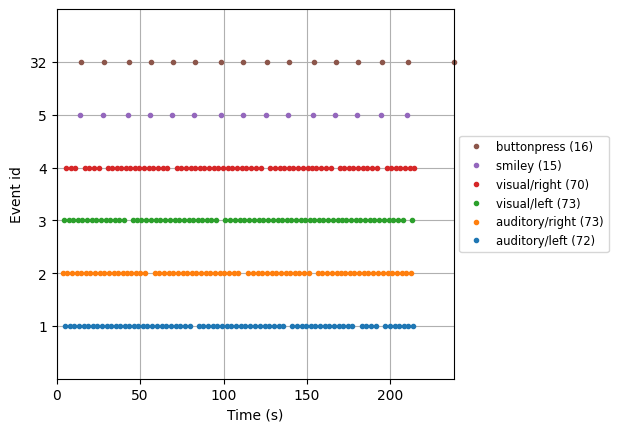

In [46]:
#Ploteamos los eventos para visualizar la distribución de los eventos en el tiempo
fig = mne.viz.plot_events(
    events, event_id=event_dict, sfreq=rawExample.info["sfreq"], first_samp=rawExample.first_samp
)

### **Generación de datos continuos**

In [47]:
#Especificamos algunas restricciones de calidad de datos
reject_criteria = dict(
    mag=4000e-15,  # 4000 fT
    grad=4000e-13,  # 4000 fT/cm
    eeg=150e-6,  # 150 µV
    eog=250e-6,
)  # 250 µV

In [48]:
#Podemos pasar los datos y los eventos a la función "mne.Epochs" para generar datos continuos
epochs = mne.Epochs(
    rawExample,    #Datos crudos
    events,    #Matriz de eventos
    event_id=event_dict,    #Diccionario de eventos
    #Duración de la ventana de tiempo antes del evento
    tmin=-0.2,  #Tiempo mínimo
    tmax=0.5,   #Tiempo máximo
    reject=reject_criteria,    #Criterios de rechazo
    #Forzamos la carga en la memoria para poder ver los datos y el criterio de rechazo
    preload=True,
)

Not setting metadata
319 matching events found
Setting baseline interval to [-0.19979521315838786, 0.0] s
Applying baseline correction (mode: mean)
Created an SSP operator (subspace dimension = 4)
4 projection items activated
Using data from preloaded Raw for 319 events and 106 original time points ...
    Rejecting  epoch based on EOG : ['EOG 061']
    Rejecting  epoch based on EOG : ['EOG 061']
    Rejecting  epoch based on MAG : ['MEG 1711']
    Rejecting  epoch based on EOG : ['EOG 061']
    Rejecting  epoch based on EOG : ['EOG 061']
    Rejecting  epoch based on MAG : ['MEG 1711']
    Rejecting  epoch based on EEG : ['EEG 008']
    Rejecting  epoch based on EOG : ['EOG 061']
    Rejecting  epoch based on EOG : ['EOG 061']
    Rejecting  epoch based on EOG : ['EOG 061']
10 bad epochs dropped


A continuación, agruparemos las presentaciones de estímulo izquierda/derecha para que podamos comparar respuestas auditivas frente a las visuales. Para evitar sesgar nuestras señales hacia la izquierda o a la derecha. Bien, usaremos "equalize_event_counts". Primero muestramos aleatoriamente épocas de cada condición para que coincida con el número de épocas presentes en la condición con el menos número de épocas buenas.

In [49]:
conds_we_care_about = ["auditory/left", "auditory/right", "visual/left", "visual/right"]
epochs.equalize_event_counts(conds_we_care_about)  # this operates in-place
aud_epochs = epochs["auditory"]
vis_epochs = epochs["visual"]
del rawExample, epochs  # free up memory

Dropped 7 epochs: 121, 195, 258, 271, 273, 274, 275


Como los objetos "Raw" los objetos "Epochs" tiene también una serie de métodos de trazado incorporados. Una de ellas es "plot_image", que muestra cada uno de las dos épocas como una fila de un mapa de imagen, con un color que represnta la magnitud de la señal; la respuesta evocada y la ubicación del sensor se muestran debajo de la imagen.

Not setting metadata
136 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
136 matching events found
No baseline correction applied
0 projection items activated


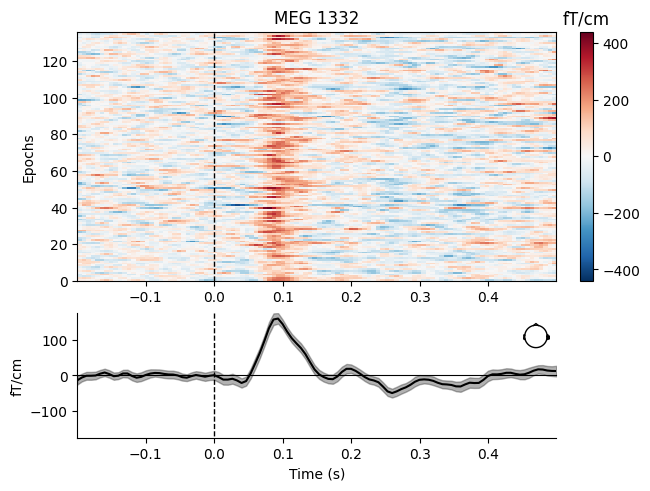

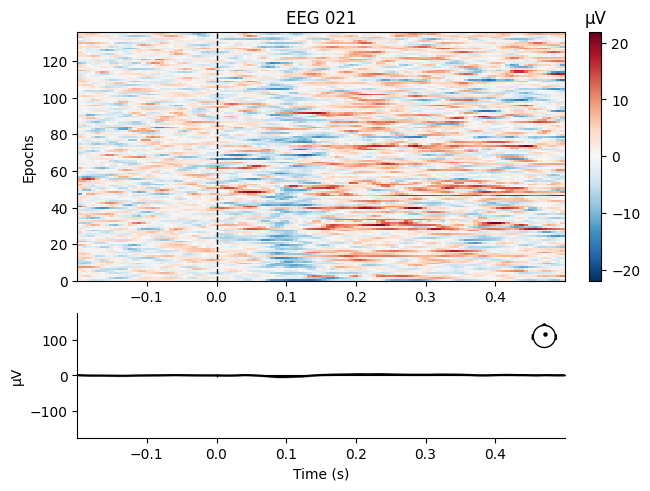

[<Figure size 640x480 with 4 Axes>, <Figure size 640x480 with 4 Axes>]

In [50]:
aud_epochs.plot_image(picks=["MEG 1332", "EEG 021"])

### **Archivos EDF (European Data Format)**
Los archivos EDF (European Data Format) son un formmato estándar para el almacenamiento y la transferencia de datos de señales fisiológicas, incluyendo señales EEG (electroencefalogramas). Este formato se utilza en el ámbito de las neurociencias y la investigación de las señales cerebrales, y es compatible con difernetes plataformas de analisis de señales y datos. Los archivos EDF permiten almacenar y organizar las señales EEG de manera estructurada, facilitando su análisis y procesamiento posterior. Además, este formato es ampliamente compatible con diferentes software y herramientas de análisis de señales, lo que facilita su integración en diversos entornos de investigación y aplicaciones clínicas.

In [51]:
#Cargamos el archivo EDF
file_path = "files/S001/S001R03.edf"
raw = mne.io.read_raw_edf(file_path)

#Imprimos informacion basica sobre el archivo EDF
print("Informacion 'raw'\n")
print(raw)
#Imprimos informacion sobre los datos, ubicaciones de los canales, filtros, proyecciones, etc.
print("Informacion 'raw.info'\n")
print(raw.info)

Extracting EDF parameters from c:\Users\josaf\OneDrive\Documents\VS Code\eeg-controller\files\S001\S001R03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Informacion 'raw'

<RawEDF | S001R03.edf, 64 x 20000 (125.0 s), ~53 kB, data not loaded>
Informacion 'raw.info'

<Info | 8 non-empty values
 bads: []
 ch_names: Fc5., Fc3., Fc1., Fcz., Fc2., Fc4., Fc6., C5.., C3.., C1.., ...
 chs: 64 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 80.0 Hz
 meas_date: 2009-08-12 16:15:00 UTC
 nchan: 64
 projs: []
 sfreq: 160.0 Hz
 subject_info: 3 items (dict)
>


### **Grafiación de los datos**

Effective window size : 12.800 (s)


Plotting power spectral density (dB=True).


C:\Users\josaf\AppData\Local\Temp\ipykernel_7336\2199122782.py:2: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raw.compute_psd(fmax=80).plot(picks="data", exclude="bads", amplitude=False)
c:\Users\josaf\AppData\Local\Programs\Python\Python312\Lib\site-packages\mne\viz\utils.py:167: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


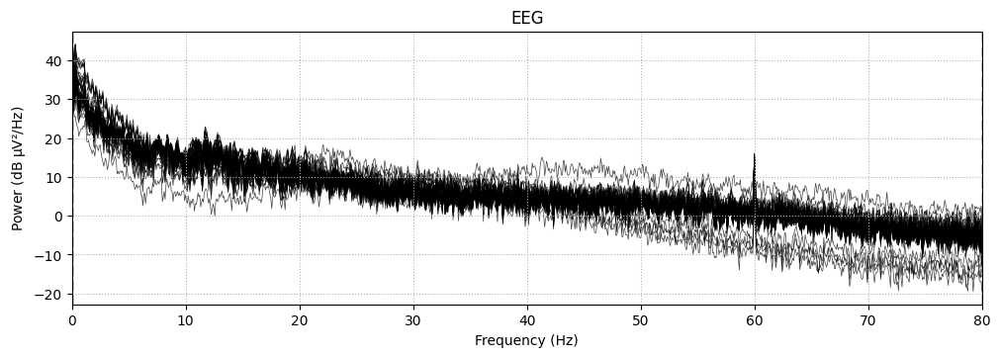

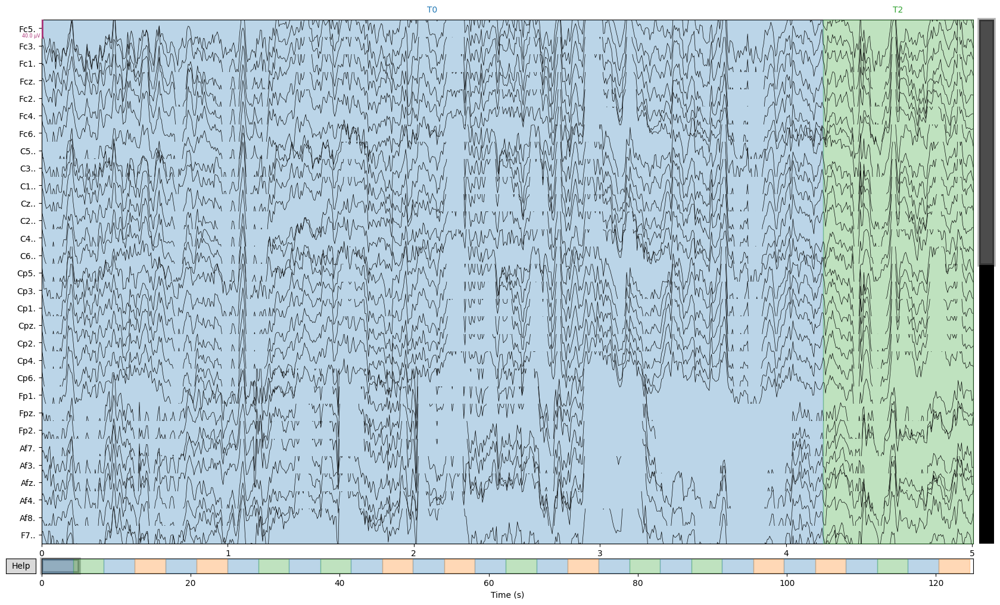

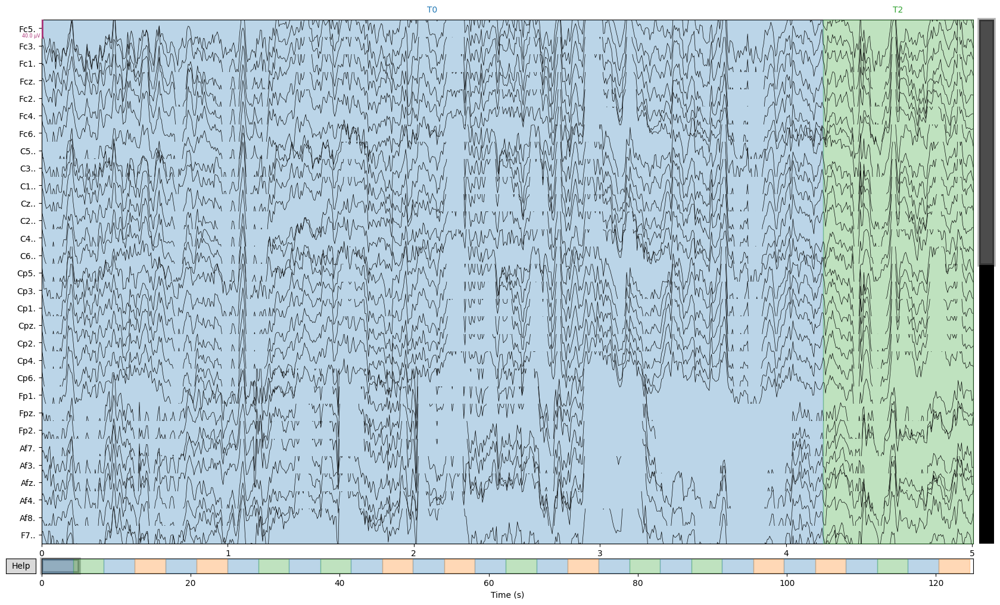

In [52]:
#Imprimimos la densidad de potencia espectral (PSD) de los datos, "fmax" es la frecuencia máxima a la que se calcula el PSD
raw.compute_psd(fmax=80).plot(picks="data", exclude="bads", amplitude=False)
#Imprimimos el grafico de los datos en bruto, este es un grafico interactivo, escalar, marcado de canales defectuosos y anotaciones.
raw.plot(duration=5, n_channels=30)

### **Detección de eventos experimentales**

Used Annotations descriptions: ['T0', 'T1', 'T2']
Used Annotations descriptions: ['T0', 'T1', 'T2']
[[    0     0     1]
 [  672     0     3]
 [ 1328     0     1]
 [ 2000     0     2]
 [ 2656     0     1]
 [ 3328     0     2]
 [ 3984     0     1]
 [ 4656     0     3]
 [ 5312     0     1]
 [ 5984     0     3]
 [ 6640     0     1]
 [ 7312     0     2]
 [ 7968     0     1]
 [ 8640     0     2]
 [ 9296     0     1]
 [ 9968     0     3]
 [10624     0     1]
 [11296     0     2]
 [11952     0     1]
 [12624     0     3]
 [13280     0     1]
 [13952     0     3]
 [14608     0     1]
 [15280     0     2]
 [15936     0     1]
 [16608     0     2]
 [17264     0     1]
 [17936     0     3]
 [18592     0     1]
 [19264     0     2]]


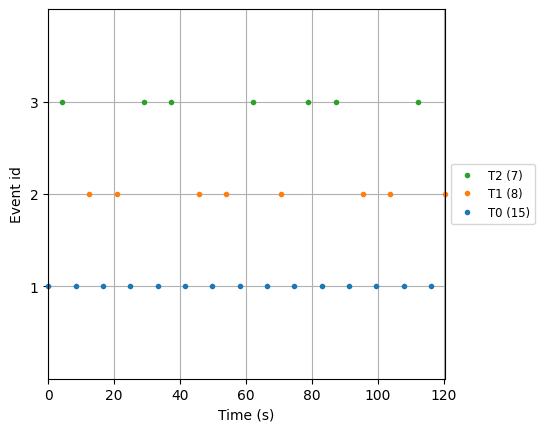

In [53]:
mne.events_from_annotations(raw)
#Detectamos eventos en los datos crudos, el canal de estimulo es "STI 014"
events, event_dict = mne.events_from_annotations(raw, event_id={'T0': 1, 'T1': 2, 'T2': 3})
print(events)

#Ploteamos los eventos para visualizar la distribución de los eventos en el tiempo
fig = mne.viz.plot_events(
    events, event_id=event_dict, sfreq=raw.info["sfreq"], first_samp=raw.first_samp
)

### **Segmentación de datos**

Used Annotations descriptions: ['T0', 'T1', 'T2']


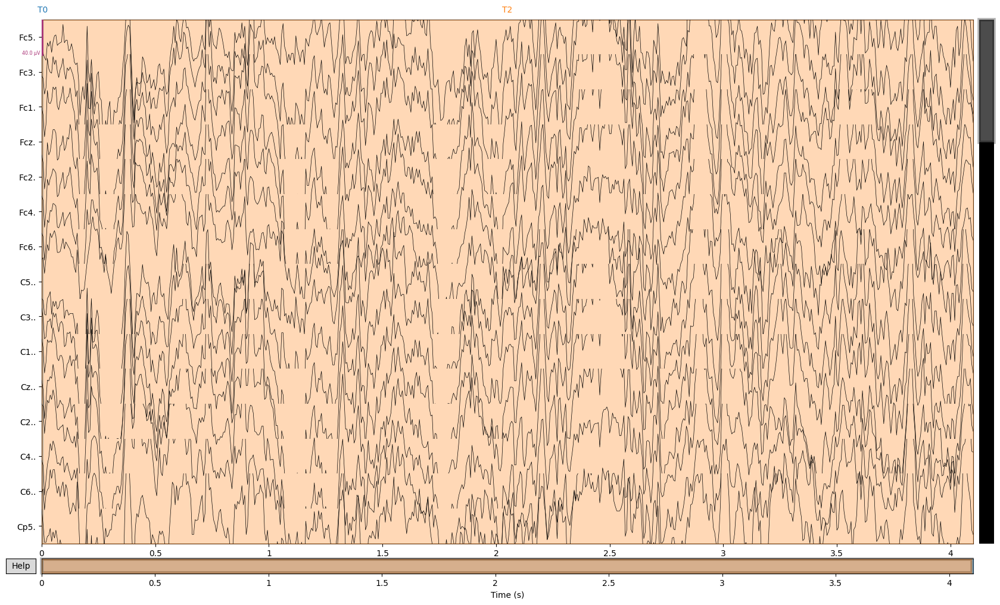

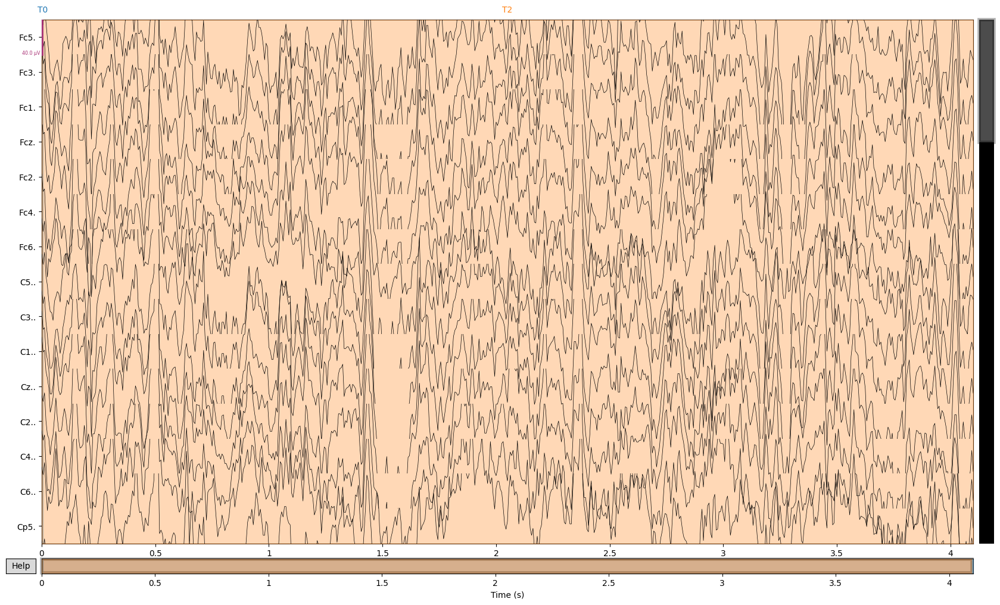

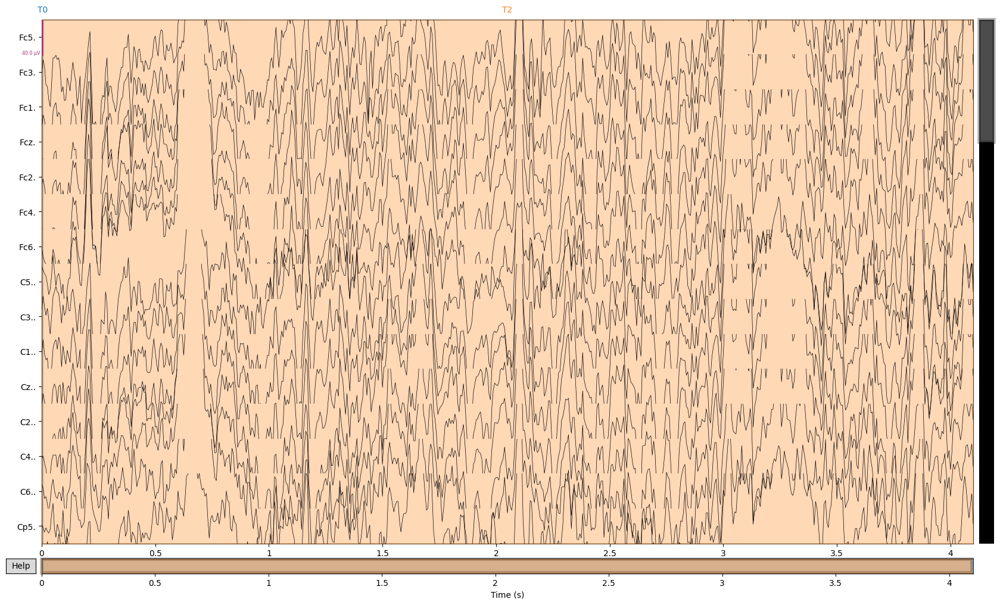

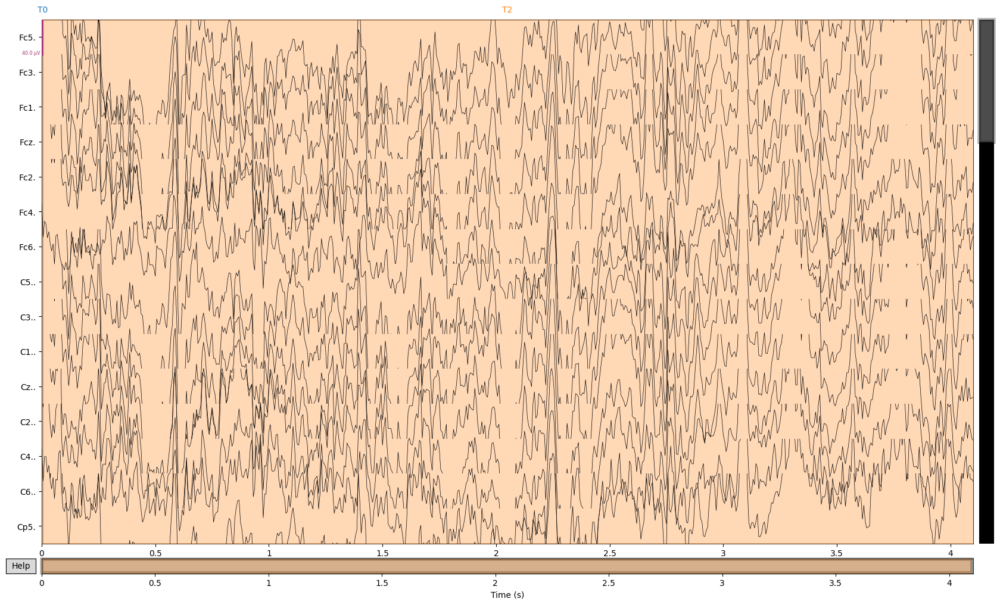

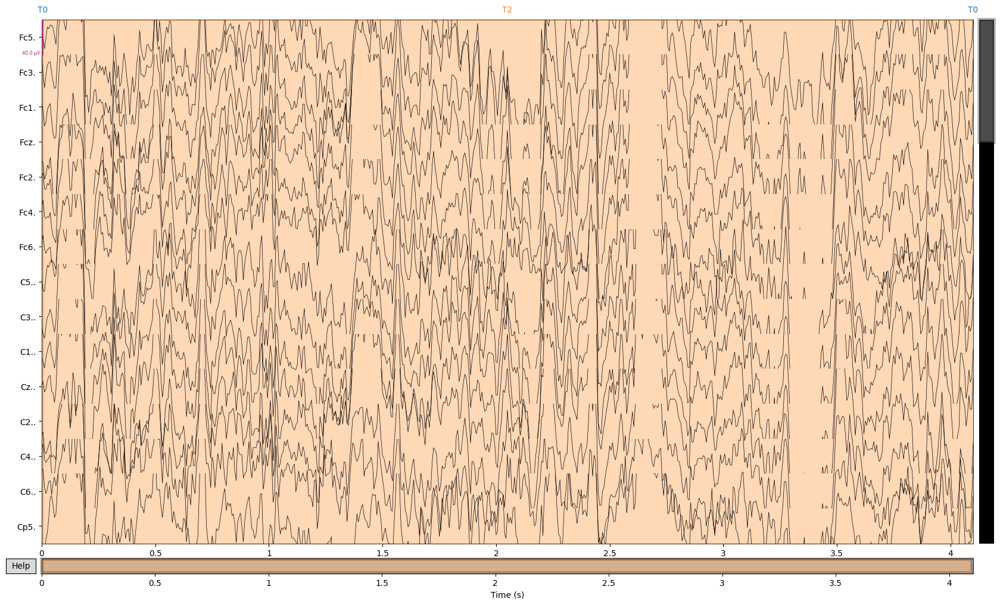

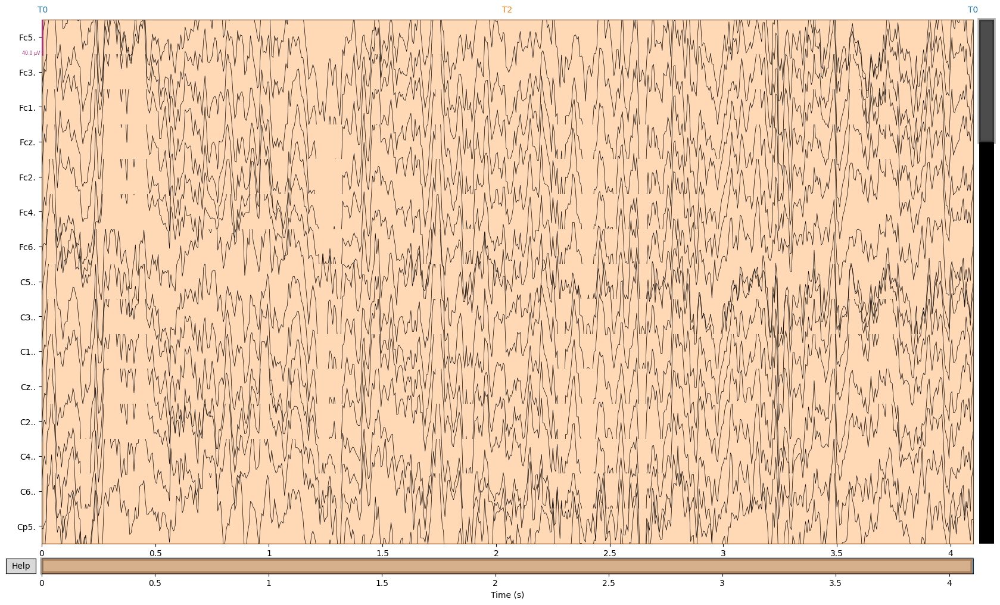

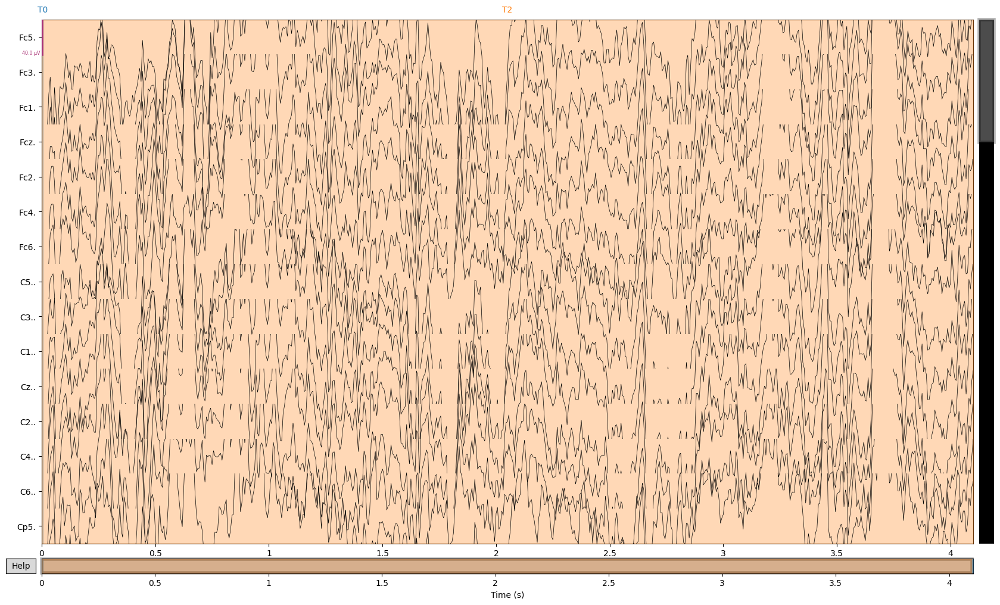

In [54]:
# Detectamos eventos en los datos crudos, el canal de estímulo es "STI 014"
events, event_dict = mne.events_from_annotations(raw, event_id={'T0': 1, 'T1': 2, 'T2': 3})

# Filtrar eventos para incluir solo los eventos T1
specific_event = events[events[:, 2] == event_dict['T2']]

# Detectamos qué evento sigue después de cada evento sleccionado
next_events = []
# Iteramos sobre los "specific_event"
for event in specific_event:
    # Buscamos el "event" en la lista de eventos original "events" y retornamos el siguiente evento
    for i, e in enumerate(events):
        if np.array_equal(e, event):
            # Si existe un evento en seguida de "event", lo agregamos a la lista "next_events" y si no agregamos "None"
            next_events.append(events[i + 1] if i + 1 < len(events) else None)
            break

# Crear una lista para almacenar los objetos Raw correspondientes a cada segmento de la tarea especifica
raw_T1_segments = []
# Creamos una lista con la duracion de cada evento
raw_T1_times = []

for i in range(len(specific_event)):
    start_time = specific_event[i][0] / raw.info['sfreq']  # Tiempo de inicio del segmento
    end_time = 0.0  # Tiempo de finalización del segmento
    
    # Determinar el tiempo de finalización del segmento
    if next_events[i] is None:
        # Si no existe otro evento despues del evento final en la lista el tiempo de finalizacion sera el tiempo final de la señal
        end_time = raw.times[-1]
    else:
        # De lo contrario, el tiempo de finalización es el tiempo de inicio de la próxima tarea
        next_event_time = next_events[i][0] / raw.info['sfreq']
        end_time = next_event_time
    
    # Segmentar la señal
    raw_segment = raw.copy().crop(tmin=start_time, tmax=end_time)
    raw_T1_segments.append(raw_segment)
    
    # Almacenar la duración del segmento
    raw_T1_times.append(end_time-start_time)

# Imprimir el gráfico de cada segmento de la señal correspondiente a las tareas T1
for i, raw_segment in enumerate(raw_T1_segments):
    # Extraemos la duracion de la lista raw_T1_times
    raw_segment.plot(duration=raw_T1_times[i], n_channels=15)

### **Preprocesamiento**
#### **Analisis de Componentes Independientes (ICA)**

In [ ]:
#Creamos una instancia de ICA con 20 componentes y un estado aleatorio
#"n_components" es el número de componentes independientes a estimar
#"random_state" es la semilla aleatoria para la inicialización
#"max_iter" es el número máximo de iteraciones para la convergencia
ica = mne.preprocessing.ICA(n_components=20, random_state=97, max_iter=800)
#Aplicamos el ICA
ica.fit(raw)
#Ploteamos las propiedades de los componentes excluidos
ica.plot_properties(raw)

### **Tecnicas de Preprocesamiento a utilizar en el manejo de las señales EEG del data de Physionet**
